### Inicio do código - O Enunciado do Exercício sobre redes neurais MLP está no final do notebook com as respontas 

In [31]:
# Carregamento de Bibliotecas necessárias para desenvolver o projeto
import tensorflow as tf
from tensorflow import keras
from dataprep.eda import create_report
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import dataprep as dp
from sklearn.model_selection import cross_val_predict, cross_val_score, KFold
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
                            accuracy_score,
                             precision_score,
                             recall_score,
                             f1_score,
                             classification_report,
                             confusion_matrix,
                             mean_absolute_error,
                             roc_curve,
                             roc_auc_score,
                             auc,
                             RocCurveDisplay
)


In [32]:
#Configura a GPU para funciona com o TensorFlow

physical_devices = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)
print(physical_devices)
print("Número de GPU's : ", len(tf.config.list_physical_devices("GPU")))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Número de GPU's :  1


## Carregando, Explorando e entendendo os dados.

In [33]:
#Carregando os dados
df=pd.read_csv("C:\BottCamp_Data  Science\Exerciccio_Redes_Neurais\dados\winequalityN.csv")
df

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,white,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,white,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,red,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
6493,red,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,NaN,11.2,6
6494,red,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
6495,red,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [34]:
# Informações sobre as variáveis
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6497 non-null   object 
 1   fixed acidity         6487 non-null   float64
 2   volatile acidity      6489 non-null   float64
 3   citric acid           6494 non-null   float64
 4   residual sugar        6495 non-null   float64
 5   chlorides             6495 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6488 non-null   float64
 10  sulphates             6493 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [35]:
#Filtragem da tabela para vinhos brancos
df_vb=df[df["type"]=="white"]

In [36]:
# Criando a coluna "good or bad", variável binária, que classifica se o vinho é bom ou ruim.
df_vb["good or bad"] = (df_vb.quality >= 6).astype(float)

C:\Users\leand\AppData\Local\Temp\ipykernel_10364\3540923434.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vb["good or bad"] = (df_vb.quality >= 6).astype(float)


In [37]:
# Viusalizando a tabela
df_vb

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,good or bad
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,1.0
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,1.0
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,1.0
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,1.0
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,white,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,1.0
4894,white,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,0.0
4895,white,6.5,NaN,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,1.0
4896,white,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,1.0


In [38]:
# Transformando a coluna em index
df_vb=df_vb.set_index('type')

In [39]:
# Visualizando a tabela após  transformar a coluna type em index
df_vb

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,good or bad
type,,,,,,,,,,,,,
white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,1.0
white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,1.0
white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,1.0
white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,1.0
white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
white,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,1.0
white,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,0.0
white,6.5,NaN,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,1.0


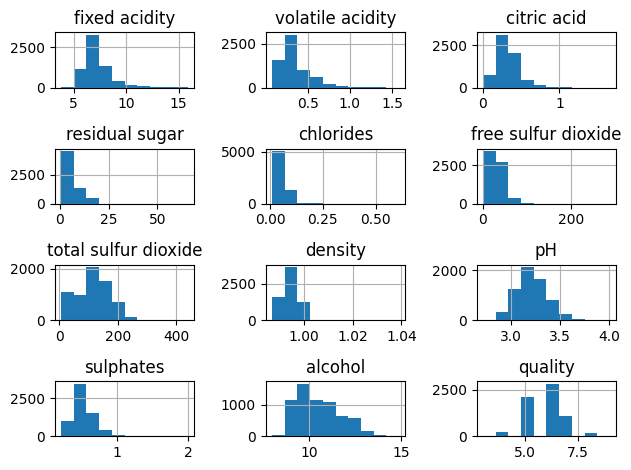

In [40]:
#Plotando o histograma das variáveis para observar a faixa dinanmica do dataset.
fig, figsize=(12,9)
df.hist()
plt.tight_layout()
plt.show()

In [41]:
# Visualizando um resumo  dos dados estátisticos
df_vb.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,good or bad
count,4890.000000,4891.000000,4896.000000,4896.000000,4896.000000,4898.000000,4898.000000,4898.000000,4891.000000,4896.000000,4898.000000,4898.000000,4898.000000
mean,6.855532,0.278252,0.334250,6.393250,0.045778,35.308085,138.360657,0.994027,3.188203,0.489835,10.514267,5.877909,0.665169
std,0.843808,0.100811,0.120985,5.072275,0.021850,17.007137,42.498065,0.002991,0.151014,0.114147,1.230621,0.885639,0.471979
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000,0.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000,0.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000,1.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000,1.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000,1.000000


  0%|          | 0/2384 [00:00<?, ?it/s]

c:\BottCamp_Data  Science\Exerciccio_Redes_Neurais\.mlpredesneurais\lib\site-packages\dask\core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


Relatório
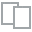
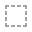
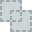
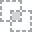
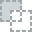
...
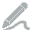
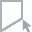
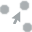
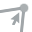
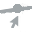

In [42]:
'''Usando a biblioteca Dataprep para ter uma visão geral dos dados da tabela ter maior compreensão
 e fazer as alteraçõescom o Pandas'''
create_report(df_vb, title='Relatório')

Text(0.5, 1.0, 'Mapa de calor de Matriz de Correlação')

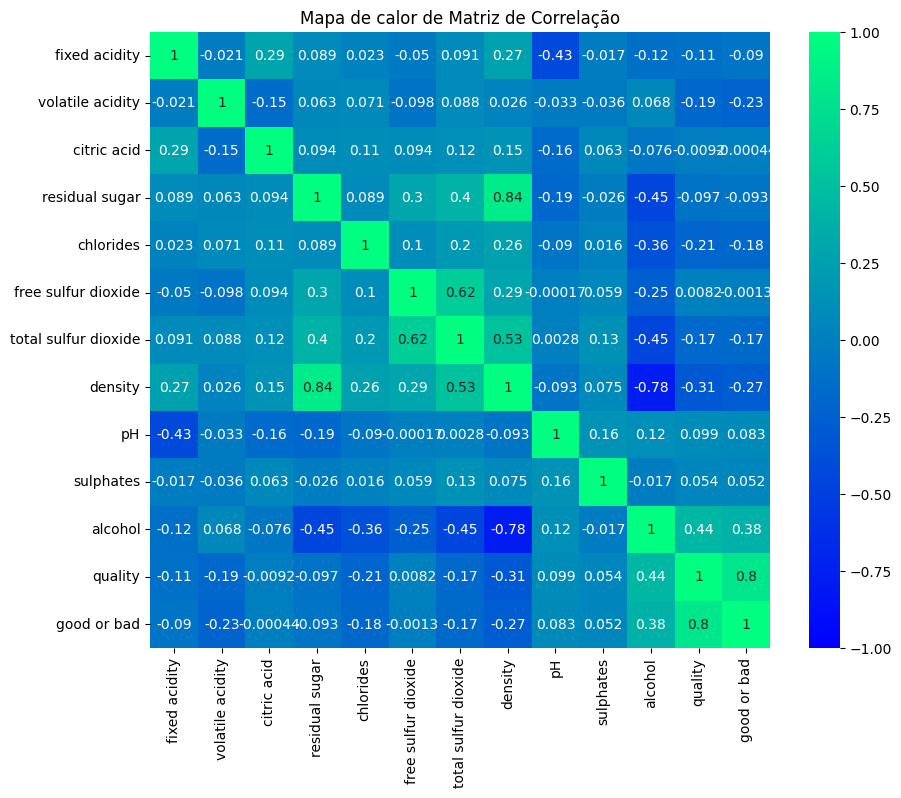

In [43]:
#Mapa de calor para a matriz de correlação para a tabela de vinhos brancos
fig, ax = plt.subplots(1,1,figsize=(10, 8))
sns.heatmap(df_vb.corr(), cmap = 'winter',vmax=1,vmin=-1, annot = True)
ax.set_title('Mapa de calor de Matriz de Correlação')

## Preparação dos Dados

In [44]:
'''A função clip(),  serve para retirar outliers assim como erros nos dados. Ao verificar os graficos boxplot é possível
verificar o primeiro ponto outlier (ponto não real, fora do esperado) e determenar o ponto máximo e pela função
describe() verificar o ponto mínimo e preencher  a função, por exemplo :  clip(valor min, valor max). Os outliers
atrapalham bastante o modelo de machine learning com pontos fora da realidade o que acarreta em um desepenho menor.'''

df_vb['volatile acidity'] = df_vb['volatile acidity'].clip(0.08,0.490)
df_vb['fixed acidity'] = df_vb['fixed acidity'].clip(3.8,8.9)
df_vb['citric acid'] = df_vb['citric acid'].clip(0,0.590)
df_vb['residual sugar'] = df_vb['residual sugar'].clip(0.6,22.6)
df_vb['chlorides'] = df_vb['chlorides'].clip(0.009,0.073)
df_vb['free sulfur dioxide'] = df_vb['free sulfur dioxide'].clip(2.00,82.00)
df_vb['total sulfur dioxide'] = df_vb['total sulfur dioxide'].clip(9.00,259.00)
df_vb['density'] = df_vb['density'].clip(0.987110,1.003)
df_vb['pH'] = df_vb['pH'].clip(2.720,3.590)
df_vb['sulphates'] = df_vb['sulphates'].clip(0.22,0.770)


df_vb

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,good or bad
type,,,,,,,,,,,,,
white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,1.0
white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,1.0
white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,1.0
white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,1.0
white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
white,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,1.0
white,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,0.0
white,6.5,NaN,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,1.0


In [45]:
# Usando a função describe para verficar se a função clip funcionou verificando os pontos mínimos  e máximos.
df_vb.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,good or bad
count,4890.000000,4891.000000,4896.000000,4896.000000,4896.000000,4898.000000,4898.000000,4898.000000,4891.000000,4896.000000,4898.000000,4898.000000,4898.000000
mean,6.844857,0.274321,0.330135,6.379156,0.043594,35.115659,138.237138,0.994017,3.187295,0.488011,10.514267,5.877909,0.665169
std,0.808406,0.087666,0.107318,4.985127,0.011505,16.048023,41.998067,0.002911,0.148155,0.108310,1.230621,0.885639,0.471979
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000,0.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000,0.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000,1.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000,1.000000
max,8.900000,0.490000,0.590000,22.600000,0.073000,82.000000,259.000000,1.003000,3.590000,0.770000,14.200000,9.000000,1.000000


In [46]:
# Verificando os dados nulos
df_vb.isnull().sum()

fixed acidity           8
volatile acidity        7
citric acid             2
residual sugar          2
chlorides               2
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      7
sulphates               2
alcohol                 0
quality                 0
good or bad             0
dtype: int64

In [47]:
#Preenchendo os dados nulos com interpolação
df_vbt=df_vb.interpolate()

In [48]:
#Fazendo a verificação da interpolação
df_vbt.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
good or bad             0
dtype: int64

In [49]:
#Verificando se tem dados duplicados
df_vbt.duplicated().sum()

928

In [50]:
#Removendo os dados duplicados
df_vbt=df_vbt.drop_duplicates()

In [51]:
#Conferindo se tem dados duplicados
df_vbt.duplicated().sum()

0

In [52]:
# Visualizando a tabela depois do tratamento
df_vbt

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,good or bad
type,,,,,,,,,,,,,
white,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,1.0
white,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,1.0
white,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,1.0
white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,1.0
white,6.2,0.320,0.16,7.0,0.045,30.0,136.0,0.99490,3.18,0.47,9.6,6,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
white,6.2,0.210,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,1.0
white,6.6,0.320,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,0.0
white,6.5,0.305,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,1.0


  0%|          | 0/2384 [00:00<?, ?it/s]

c:\BottCamp_Data  Science\Exerciccio_Redes_Neurais\.mlpredesneurais\lib\site-packages\dask\core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


Relatório
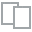
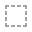
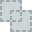
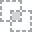
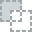
...
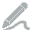
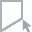
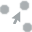
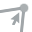
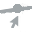

In [53]:
#Usando a biblioteca Dataprep para ter uma visão geral após o tratamento.
create_report(df_vbt, title='Relatório')

In [54]:
df_vbt.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'good or bad'],
      dtype='object')

In [55]:
X=df_vbt[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality']]

y=df_vbt['good or bad']

In [56]:


# Escalonamento dos dados 
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # Escalonamento dos dados



## Modelagem Com Validação Cruzada

In [57]:


# Definir o número de folds para a validação cruzada
k = 10
cv = KFold(n_splits=k, random_state=42, shuffle=True)

# Listas para armazenar as métricas de desempenho
accuracies = []
precisions = []
recalls = []
f1_scores = []
predictions = []
y_true = []

fold=1
# Executar a validação cruzada
for train_index, test_index in cv.split(X_scaled):
    print(f"==================================== Fold {fold}: =========================================")
    print()
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Definir a arquitetura do modelo da rede neural
    model = keras.Sequential([
        keras.layers.Dense(3, activation='relu', input_shape=(12,)),
        #keras.layers.Dense(4, activation='relu'),
        keras.layers.Dense(1, activation='sigmoid')
])

    # Compilar o modelo
    model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])
    
    # Treinar o modelo
    model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=1)
    
    # Fazer previsões no conjunto de teste
    
    y_pred = (model.predict(X_test) >= 0.6).astype(int)
    
    # Calcular as métricas de desempenho
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    
    # Armazenar as métricas de desempenho e previsões
    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    predictions.extend(y_pred)
    y_true.extend(y_test)

    print()
    # Exibir as métricas de desempenho para o fold atual
    print(f"Acurácia: {accuracy:.4f}")
    print(f"Precisão: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-score: {f1:.4f}")
    print()
    
    
    fold += 1
print()
# Exibir as métricas de desempenho médias e desvio padrão
print("Média e desvio padrão respectivamente para as métricas de desempenho:")
print(f"Acurácia: {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")
print(f"Precisão: {np.mean(precisions):.4f} ± {np.std(precisions):.4f}")
print(f"Recall: {np.mean(recalls):.4f} ± {np.std(recalls):.4f}")
print(f"F1-score: {np.mean(f1_scores):.4f} ± {np.std(f1_scores):.4f}")


==================================== Fold 1: =========================================

Epoch 1/10
112/112 [==============================] - 1s 5ms/step - loss: 0.6039 - accuracy: 0.6924
Epoch 2/10
112/112 [==============================] - 1s 6ms/step - loss: 0.5290 - accuracy: 0.7462
Epoch 3/10
112/112 [==============================] - 1s 5ms/step - loss: 0.4814 - accuracy: 0.7865
Epoch 4/10
112/112 [==============================] - 1s 5ms/step - loss: 0.4414 - accuracy: 0.8279
Epoch 5/10
112/112 [==============================] - 1s 7ms/step - loss: 0.4030 - accuracy: 0.8578
Epoch 6/10
112/112 [==============================] - 1s 6ms/step - loss: 0.3655 - accuracy: 0.8802
Epoch 7/10
112/112 [==============================] - 1s 6ms/step - loss: 0.3279 - accuracy: 0.9076
Epoch 8/10
112/112 [==============================] - 1s 6ms/step - loss: 0.2892 - accuracy: 0.9331
Epoch 9/10
112/112 [==============================] - 1s 5ms/step - loss: 0.2512 - accuracy: 0.9572
Epoch 10/10


125/125 [==============================] - 0s 2ms/step


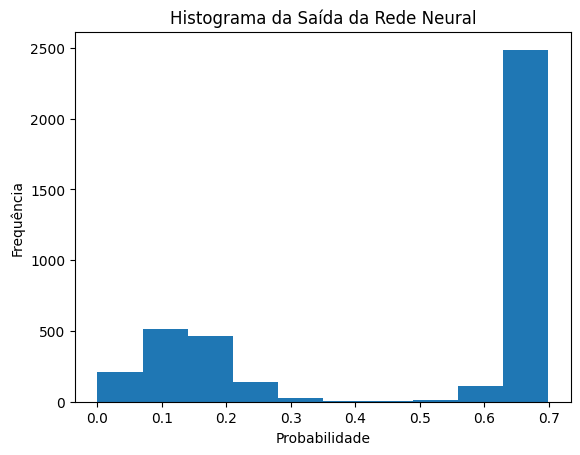


 Média e desvio padrão no histograma:
Média:
0.4989

Desvio Padrão:
0.2668


In [58]:


# # Plotar o histograma da saída da rede neural
y_prob = model.predict(X_scaled)
plt.hist(y_prob, bins=10)
plt.xlabel('Probabilidade')
plt.ylabel('Frequência')
plt.title('Histograma da Saída da Rede Neural')
plt.show()

cm_meanh = np.mean(y_prob)
cm_stdh = np.std(y_prob)

print("\n Média e desvio padrão no histograma:")
print("Média:")
print(f"{cm_meanh:.4f}")

print("\nDesvio Padrão:")
print(f"{cm_stdh:.4f}")


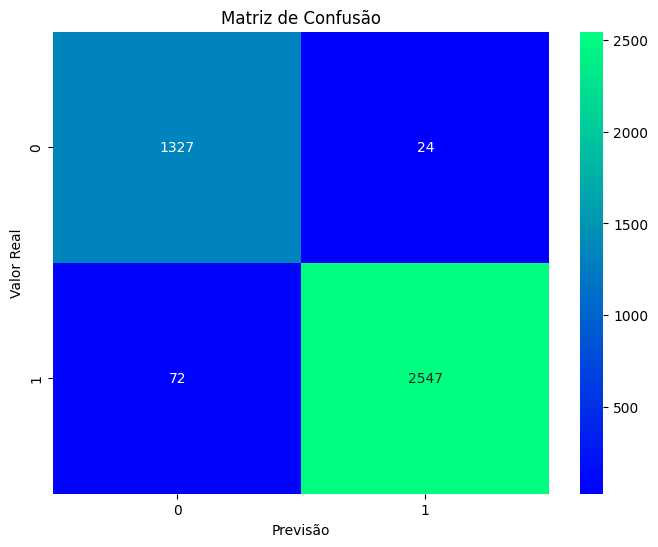


Matriz de Confusão linha (valor Real):
Média:
[ 675.5 1309.5]

Desvio Padrão:
[ 651.5 1237.5]

Matriz de Confusão Coluna (Previsão):
Média:
[ 699.5 1285.5]

Desvio Padrão:
[ 627.5 1261.5]


In [59]:
# # Calcular e exibir a matriz de confusão
confusion = confusion_matrix(y_true, predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, cmap='winter', fmt='d')
plt.xlabel('Previsão')
plt.ylabel('Valor Real')
plt.title('Matriz de Confusão')
plt.show()



# Calcular a média e o desvio padrão da matriz de confusão linha (horizontal)
cm_meanl = np.mean(confusion, axis=1)
cm_stdl = np.std(confusion, axis=1)

# Calcular a média e o desvio padrão da matriz de confusão linha coluna (vertical)
cm_meanc = np.mean(confusion, axis=0)
cm_stdc = np.std(confusion, axis=0)




# Imprimir a matriz de confusão média e desvio padrão
print("\nMatriz de Confusão linha (valor Real):")
print("Média:")
print(cm_meanl)

print("\nDesvio Padrão:")
print(cm_stdl)


print("\nMatriz de Confusão Coluna (Previsão):")
print("Média:")
print(cm_meanc)

print("\nDesvio Padrão:")
print(cm_stdc)


# Respondendo as Perguntas do Exercicio

#### Enunciado do Exercicio

Caro (a) Leandro,
Chegamos no final da nossa disciplina e você irá realizar um projeto para demonstrar as competências aprendidas aqui.

1.Escolha uma base de dados. Essa base deve ser multivariada e possuir uma variável objetivo, que pode ser usada na fase de treino (modelos supervisionados) e/ou na validação do modelo (modelos supervisionados e não-supervisionados)

OBS: Caso você não possua uma base, utilize a base de dados de vinho brancos. Considere bons vinhos aqueles que obtiveram notas >= 6. Como motivo da escolha (questão 2.a) apenas indique utilizou a base proposta pelo professor.

2. A partir da base escolhida, você irá aplicar as etapas do modelo
CRISP ( https://en.wikipedia.org/wiki/Cross-industry_standard_process_for_data_mining ) de desenvolvimento de projetos em Ciência de Dados:

![](https://keithmccormick.com/wp-content/uploads/CRISP-DM.jpg)


a. Explique a origem dos dados e o motivo para a escolha. Descreva, também, como os dados foram obtidos. Essa é a fase de COMPREENSÃO DO NEGÓCIO.

### Dados propostos pelo professor. O objetivo do projeto do vinho branco classificado como bom ou ruim para que possa ajudar na produção em uma vinicola possa ser mais assertiva, mais produtiva quanto a qualidade dos vinhos brancos.

b. Descreva as variáveis do problema e o tipo de cada uma (categórica ou numérica). Mostre a distribuição (usando um histograma) para cada uma delas. Comente sobre a faixa dinâmica de cada uma delas. Essa é a fase de COMPREENSÃO DOS DADOS.

### Esse é um problema de classificação em que uma determinada garrafa de  vinho branco é rotulada, como  vinho bom ou ruim. As seguintes variaveis são do tipo númericas continuas,'fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar','chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density','pH', 'sulphates' e 'alcohol'. A variável  'quality' é do tipo númerica inteira , a variável 'type' é categorica, já a variável criada 'good or bad' é binária.

### Quando a faixa dinanmica dos valores da variáveis, existe no geral grandes diferenças entre os valores mínimos e valores máximos indicando uma maior despersão de valores.

c.  Descreva o objetivo do modelo que será criado neste projeto.

### Fazer um modelo que indica com maior asertividade a qualidade do vinho branco.

d. Agora faça o tratamento de dados necessários para o treinamento: escalonamento, normalização, transformação e variável (ex: aplicar a função log em uma variável com distribuição exponencial), separação entre treino e teste… Você deve optar pelas tarefas necessárias, descrevendo cada uma delas e justificando o motivo. Essa é a fase PREPARAÇÃO DOS DADOS

### Para este problema será feito o escalonamentos para ajustar as variaveis na mesma escala para não haver discrepancias ou enviesamento , remoção de duplicatas visto que existem muitas na base de dados , remoção de valores nulos  ou vazios que interferem no resultado negatiamente, e  a separação entre treino e teste que é essencial antes da modelagem. para verificar o desepenho do modelo, podendo usar as figuras de merito validação cruzada com K folds e calculo de incertezas.  

e. Agora defina o modelo de redes neural do tipo MLP que você irá utilizar. Essa é a fase de MODELAGEM:

i. Quantas camadas?

### 1 Camada 

ii.Quantos neurônios na camada de entrada?

### São 12 neurônios de entrada que são correspondentes as variaveis usadas na entrada do modelo.

iii. Quantos neurônios na camada de saída? Justifique.

### É 1 neurônio na saida porque é um problema de classificação binario , para saber se o vinho é bom ou ruin.

iv. Quantos números de neurônios na camada intermediária? Como esse número foi escolhido?

### Foi escolhidos 3 neuronios na camada intermediária. O número foi escolhido de forma empirica por tentativa e erro , testando o modelo várias vezes, já que não existe uma forma  específica padronizada para se determinar o número de neurônios.

v.Qual será o algoritmo utilizado no treinamento?

### Seré utilizado o Backpropagation , propaga o erro da saida para trás, processo supervisionado,  para que as correções nos pesos seja feita usando algoritmo de otmização, gradiente descendete etc.

vi.Qual a função de ativação será utilizada em cada camada? Justifique.

### Será utilizado Relu na camada de entreda, e  intermediária por ser uma função  que introduz a não linearidade ao modelo e ajuda computacionalmente na mitigação do desvanecimento do gradiente. Para a saida será usado a função Sigmoid que é voltada para problemas de classificação binário.

vii. Qual a função de otimização será utilizada neste treinamento?

### ADAM (Adaptive Moment Estimation)  , por ser adaptável, fazendo os ajustes dos pesos.

viii.Quais serão as figuras de mérito que serão usadas na avaliação do modelo. Justifique.

### Capacidade de generalização, complexidade e eficiencia computacional, visto que não existe uma forma  específica para se determinar o número de neurônios e a questão do tempo gasto no processamento é muito importante para a produtividade do trabalho no fluxo de projeto. A generização é a capacidade do modelo de ser preciso , quando é testada com dados novos que não fizeram parte do treinamento.

f. Apresente os seguintes resultados:

i. A matriz de confusão do problema
### No notebook
ii. O(s) histograma(s) da(s) saída(s) da rede neural
### No notebook
iii. Os valores das figuras de métrica utilizadas.
### No notebook 
iv. Caso tenha utilizado validação cruzada no treino, apresente as incertezas para cada um dos resultados anteriores.
### validação Cruzada feita no notebook com as incertezas para matriz de confusão, histograma e figuras métricas.
g. Avalie os resultados, dando sua interpretação de acordo com a compreensão da natureza do problema proposto.Essa é a fase de AVALIAÇÃO DO MODELO.

### Testando o modelo com várias configurasções , como por exemplo 2 camadas iniciais escondidas  com 64 neurônios cada, mais de 100 épocas foi possível verificar o Overfitting  tanto com relação ao número excessivo de neuronios como também ao número excessivo de épocas, o que deixa o modelo viciado, e quando submetido a dados reais ou generalizado tem desepenho abaixo do esperado. Foram feitos teste até convergir para uma arquitetura com uma camada intermediária (escondida) com 3 neurônios, com 10 epocas, sendo a arquitetura aproximadamente mais adequada, lavando-se em consideração a baixa  complexidade do modelo, a generalização e tempo de processamento.

### Para esse exercicio foi utilizado a GPU com o intuito  de obter um processamento de treinamento de redes neurais mais rápido. Apesar da rede neural ser de baixa complexidade a velocidade de processamento em vários testes de arquitetura de rede neural apresentou bom desempenho, sendo que foram feitos testes mais complexas com validação cruzada K=10. Para tal usabilidade,  a GPU foi programada para que a mesma seja utilizada aos poucos e de forma gradativa auxiliando  o processador da máquina que ficou com a maior parte do processamneto.

###  Após uma serie de teste empiricos, a arquitetura montada foi a de 1 camada escondida com 3 neurônios, e 1 neurônio de saída por se tratar de um problema de classificação binário.  Na parte de tratamento de dados foi feita a retirada dos outliers e observou-se que o modelo respondeu com uma pequena melhora nos valores de figuras de merito. Outro teste que foi feito, foi a não retirada de dados  duplicados , o que fez com que o número de linhas, consequentemente de dados fosse maior, fazendo com que o modelo melhorasse os valores da figura de mérito e matriz de confusão. Para o modelo final foi adotado a retirada dos outliers, o que ajudar na melhoria do resultado,  e a remoção das linhas duplicadas, o que acarretou em mudança significativa,  obtendo-se um resultado geral muito bom com a validação cruzada com K=10 folds.No final a arquitetura atendeu aos objetivos do négócio obtendo uma acurácia de 0.97 e tendo uma maior assertividade na classificação dos vinhos brancos  em bom ou ruim , e assim contribuir com o processo de produção na vinicola. 

Assim que terminar, salve o seu arquivo HTML ou PDF (exportado de um Jupyter Notebook) e poste no Moodle. Utilize o seu nomepara nomear o arquivo, identifi cando também a disciplina no seguinte formato: “nomedoaluno_nomedadisciplina_pd.html” ou“nomedoaluno_nomedadisciplina_pd.pdf”.


# Fim do Exercício

In [61]:
!pip freeze > requirements.txt